# 🚢 Detecting Anomalous Activity in a Ship’s Engine

## 📊 Business Context

In this mini-project, you are provided with a real-world dataset (Devabrat, 2022) to detect anomalous activity in ship engine functionality. Anomalies typically comprise a small minority of data points—roughly 1% to 5%—and can indicate operational issues or early signs of mechanical failure.

The dataset includes **six key features** that are continuously monitored to assess whether an engine is operating under “good” or “bad” conditions:

- **Engine RPM (Revolutions Per Minute):**  
  High RPM for extended periods can cause overheating and wear; low RPM might signal power issues or mechanical faults.

- **Lubrication Oil Pressure:**  
  Low pressure = insufficient lubrication (friction/damage). High pressure = potential blockages or seal failures.

- **Fuel Pressure:**  
  High = possible poor combustion or injector damage. Low = may result in poor performance or fuel delivery problems.

- **Coolant Pressure:**  
  Low = potential leaks or pump failure. High = possible blockages or gasket failure.

- **Lubrication Oil Temperature:**  
  High temperature degrades oil quality; low temp might mean sub-optimal lubrication.

- **Coolant Temperature:**  
  High = overheating risks (e.g., failed thermostat); low = engine may not be reaching optimal efficiency.

---

Engine malfunctions can lead to costly delays, safety risks, and damaged customer trust. Your task is to build a **robust anomaly detection system** that can flag early warnings, enabling timely maintenance and reducing unplanned downtime.

### 🧠 Key Objectives

- Preprocess and explore the data
- Engineer relevant features
- Train an unsupervised anomaly detection model
- Interpret results and identify thresholds
- Provide business-driven insights

---

## 🔍 Stakeholder-Facing Questions

- What insights can be drawn from the sensor data?
- Which features are the strongest indicators of anomaly?
- What thresholds should be monitored closely?
- Which ML techniques are most effective on this dataset?
- Can a univariate or multivariate approach better inform predictive maintenance?

---

## 📈 Next Steps

- Tune Isolation Forest hyperparameters
- Compare with alternative unsupervised models (e.g. One-Class SVM, Autoencoders)
- Design a real-time dashboard or alerting mechanism (bonus)

---

> **Disclaimer:**  
> While the dataset is real, the business context is fictitious. This project is for educational purposes only. Any resemblance to real companies or individuals is purely coincidental.

---

## 📝 Acknowledgments

Special thanks to the **University of Cambridge** for designing the learning experience behind this project as part of the **Data Science Career Accelerator**.

---

## 📎 Related Write-Up

🔗 [Ship Engine Anomaly Detection – Substack Article](https://open.substack.com/pub/prasanth2402/p/ship-engine-anomaly-detection)

---


# Import packages and data

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.ensemble import IsolationForest
from itertools import combinations
import math
from sklearn.svm import OneClassSVM
from sklearn.preprocessing import RobustScaler
import torch

In [2]:
# Load the dataset
data = pd.read_csv("./data/engine.csv")

# EDA

In [3]:
# Display the first few rows of the data set.
data.head()

,Engine rpm,Lub oil pressure,Fuel pressure,Coolant pressure,lub oil temp,Coolant temp
0,682,2.391656,4.617196,2.848982,76.272417,69.884609
1,605,5.466877,6.424361,5.727520,73.222679,74.907314
2,658,3.434232,3.680896,1.678708,88.089916,78.704806
3,749,2.094656,7.120927,1.639670,77.661625,82.386700
4,676,3.538228,5.956472,3.225336,75.226352,67.153220


In [ ]:
# Find missing values
print(f"Find missing values")
print(f"-----------------------")
print(data.isnull().sum())

# Find duplicate rows
print(f"\nFind duplicate rows")
print(f"-----------------------")
print(data.duplicated().unique())

Find missing values
-----------------------
Engine rpm          0
Lub oil pressure    0
Fuel pressure       0
Coolant pressure    0
lub oil temp        0
Coolant temp        0
dtype: int64

Find duplicate rows
-----------------------
[False]


## Descriptive statistics


In [ ]:
# Descriptive statistics
data.describe(percentiles=[.25, .5, .75, .95]).T

,count,mean,std,min,25%,50%,75%,95%,max
Engine rpm,19535.0,791.239263,267.611193,61.000000,593.000000,746.000000,934.000000,1324.000000,2239.000000
Lub oil pressure,19535.0,3.303775,1.021643,0.003384,2.518815,3.162035,4.055272,5.058040,7.265566
Fuel pressure,19535.0,6.655615,2.761021,0.003187,4.916886,6.201720,7.744973,12.208475,21.138326
Coolant pressure,19535.0,2.335369,1.036382,0.002483,1.600466,2.166883,2.848840,4.438415,7.478505
lub oil temp,19535.0,77.643420,3.110984,71.321974,75.725990,76.817350,78.071691,84.940778,89.580796
Coolant temp,19535.0,78.427433,6.206749,61.673325,73.895421,78.346662,82.915411,88.612891,195.527912


In [ ]:
data.agg(["median"])

,Engine rpm,Lub oil pressure,Fuel pressure,Coolant pressure,lub oil temp,Coolant temp
median,746.0,3.162035,6.20172,2.166883,76.81735,78.346662


In [ ]:
print(f"Range value beyond 95th percentiles")
print(f"-----------------------------------")
for column in data.columns:
  agg_percentiles = data[column].agg(['max', lambda x: x.quantile(0.95)])
  print(f"{column}: {agg_percentiles.iloc[0] - agg_percentiles.iloc[1]:.2f}")

Range value beyond 95th percentiles
-----------------------------------
Engine rpm: 915.00
Lub oil pressure: 2.21
Fuel pressure: 8.93
Coolant pressure: 3.04
lub oil temp: 4.64
Coolant temp: 106.92


# Visualisation of data distribution

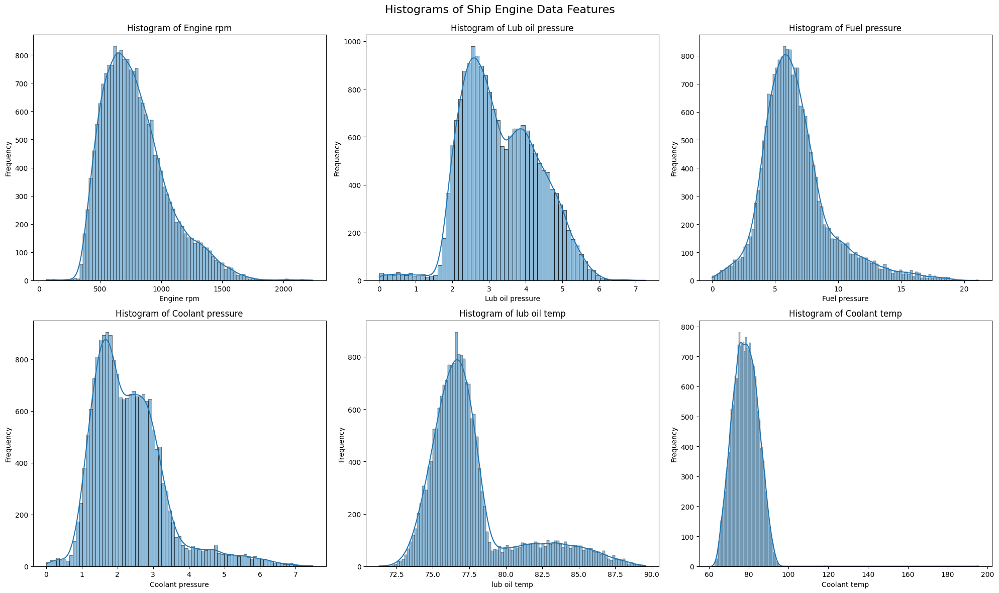

In [ ]:
# Create a 3x2 grid of subplots
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
fig.suptitle('Histograms of Ship Engine Data Features', fontsize=16)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot histograms for each feature
for i, col in enumerate(data.columns):
    sns.histplot(data[col], kde=True, ax=axes[i])
    axes[i].set_title(f'Histogram of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

# Adjust the layout and display the plot
plt.tight_layout()
plt.subplots_adjust(top=0.93)  # Adjust to prevent title overlap
plt.show()

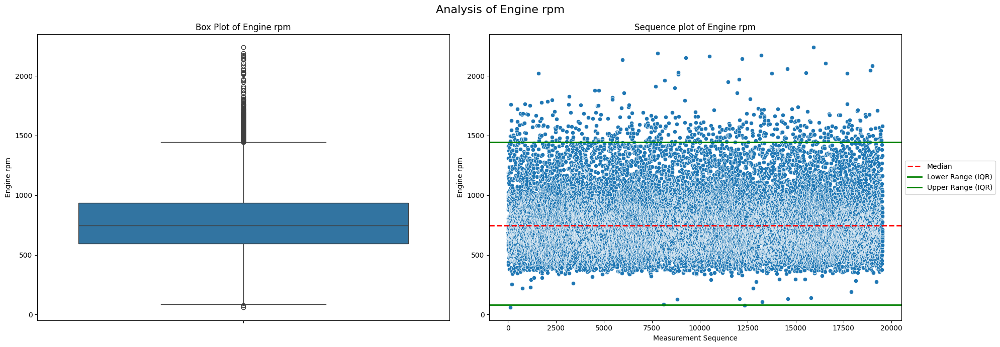

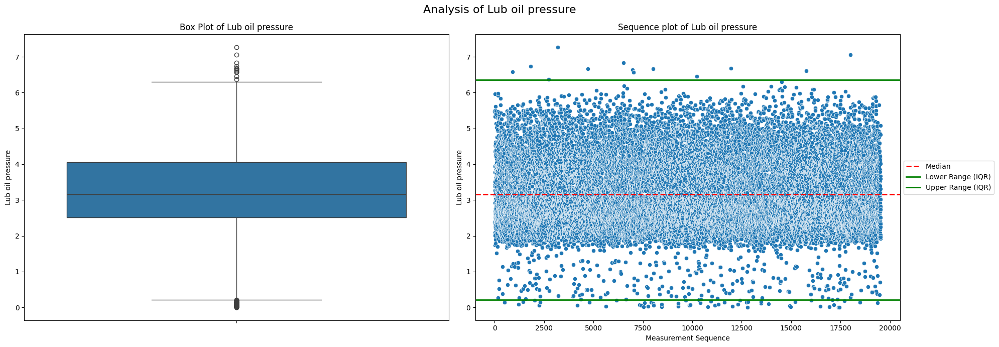

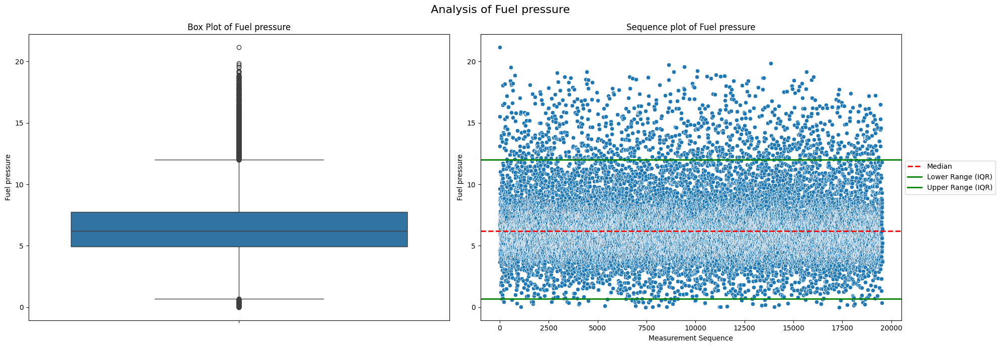

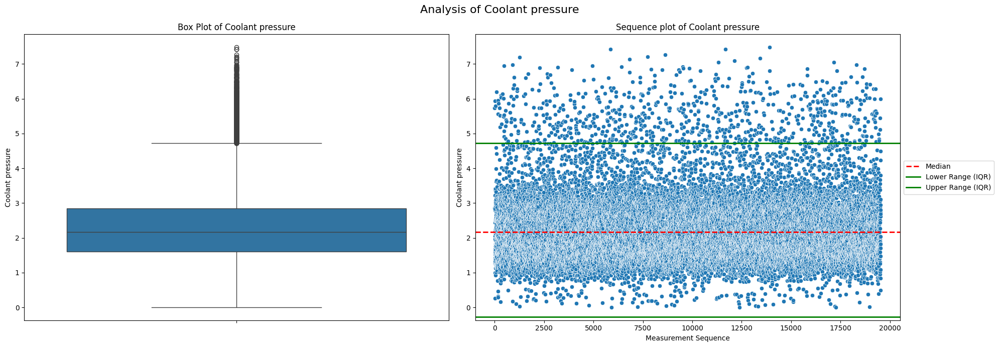

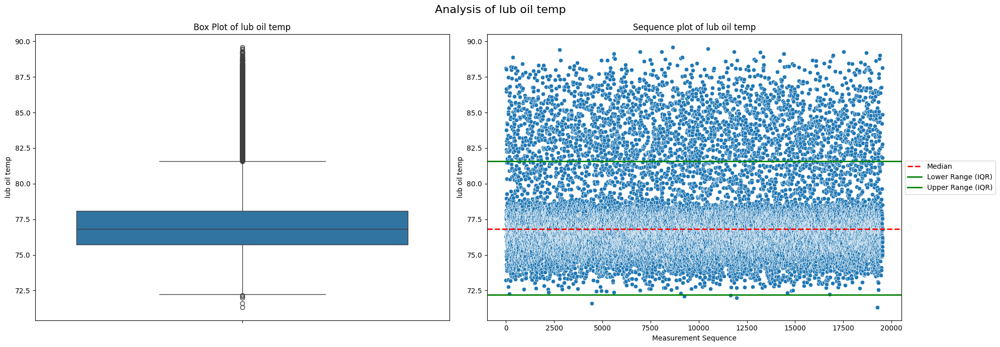

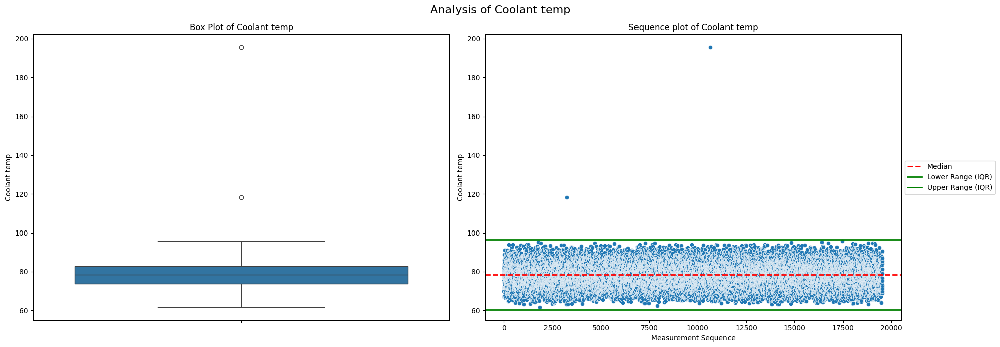

In [ ]:
# Create side-by-side box plot and scatter plot for each column
for column in data.columns:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))
    fig.suptitle(f'Analysis of {column}', fontsize=16)

    # Box plot
    sns.boxplot(y=data[column], ax=ax1)
    ax1.set_title(f'Box Plot of {column}')
    ax1.set_ylabel(column)

    # Scatter plot
    sns.scatterplot(x=data.index, y=data[column], ax=ax2)
    ax2.set_title(f'Sequence plot of {column}')
    ax2.set_xlabel('Measurement Sequence')
    ax2.set_ylabel(column)

    # Add a horizontal line at the median
    median_value = data[column].median()
    ax2.axhline(y=median_value, color='r', linestyle='--', linewidth=2, label='Median')

    # Add horizontal lines at Q1 and Q3
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    ax2.axhline(y=Q1 - 1.5*IQR, color='g', linestyle='-', linewidth=2, label='Lower Range (IQR)')
    ax2.axhline(y=Q3 + 1.5*IQR, color='g', linestyle='-', linewidth=2, label='Upper Range (IQR)')

    ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)

    plt.tight_layout()
    plt.show()

## Key observations from visualisations


**Engine RPM:**

* Right-skewed distribution with main concentration between 500-1000 RPM
* Clear outliers above 1500 RPM that could indicate dangerous operating conditions
* Median around 746 RPM with relatively stable operation pattern


**Pressure Metrics:**

* Lubrication Oil: Shows bimodal distribution suggesting two distinct operating states
* Fuel Pressure: Right-skewed with significant outliers above 15 units
* Coolant Pressure: Similar pattern to lub oil, with defined normal operating ranges


**Temperature Measurements:**

* Lub Oil Temp: Notably tight distribution (71-90°C) with few outliers
* Coolant Temp: Much wider range with extreme outliers up to 195°C, potential critical failures

**Anomaly Indicators:**

* Most variables show clear IQR boundaries in sequence plots
* Coolant temperature has the most concerning outliers, with spikes up to 195°C
* All parameters show stable medians but with regular excursions beyond IQR bounds

## Correlation Analysis

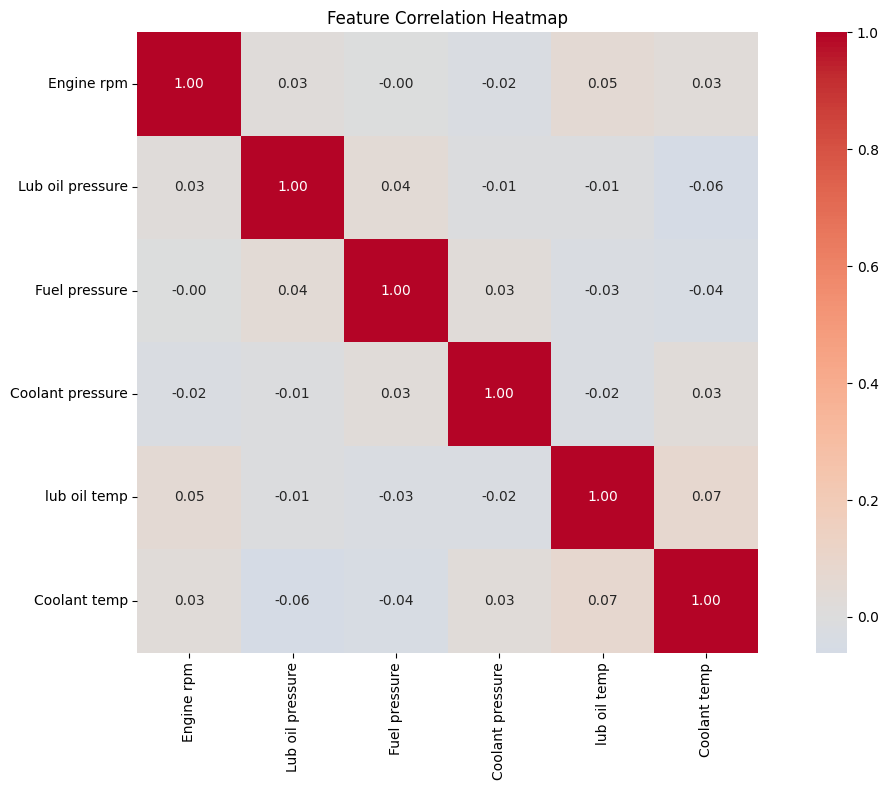


Strongest Feature Correlations:
lub oil temp - Coolant temp: 0.073
Lub oil pressure - Coolant temp: 0.061
Engine rpm - lub oil temp: 0.052
Lub oil pressure - Fuel pressure: 0.044
Fuel pressure - Coolant temp: 0.043


In [ ]:
plt.figure(figsize=(12, 8))
correlation_matrix = data.corr()

# Create heatmap
sns.heatmap(correlation_matrix,
            annot=True,  # Show correlation values
            cmap='coolwarm',  # Color scheme
            center=0,  # Center the colormap at 0
            fmt='.2f',  # Format correlation values to 2 decimal places
            square=True)  # Make cells square

plt.title('Feature Correlation Heatmap')
plt.tight_layout()
plt.show()

# Print strongest correlations
print("\nStrongest Feature Correlations:")
strongest_corr = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        strongest_corr.append({
            'features': f"{correlation_matrix.columns[i]} - {correlation_matrix.columns[j]}",
            'correlation': abs(correlation_matrix.iloc[i,j])
        })

strongest_corr = sorted(strongest_corr, key=lambda x: x['correlation'], reverse=True)
for corr in strongest_corr[:5]:
    print(f"{corr['features']}: {corr['correlation']:.3f}")

# Anomaly detection with statistical method (IQR)

In [ ]:
# Identify outliers using IQR method
def identify_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return (df[column] < lower_bound) | (df[column] > upper_bound)

# Create binary outlier columns for each feature
data_outliers = data.copy()
for column in data.columns:
    data_outliers[f'{column}_flagged'] = identify_outliers(data_outliers, column).astype(int)

# Identify samples with two or more outlier features
outlier_columns = [col for col in data_outliers.columns if col.endswith('_flagged')]
data_outliers['IQR_preds'] = (data_outliers[outlier_columns].sum(axis=1) >= 2).astype(int)
data_outliers.head()

,Engine rpm,Lub oil pressure,Fuel pressure,Coolant pressure,lub oil temp,Coolant temp,Engine rpm_flagged,Lub oil pressure_flagged,Fuel pressure_flagged,Coolant pressure_flagged,lub oil temp_flagged,Coolant temp_flagged,IQR_preds
0,682,2.391656,4.617196,2.848982,76.272417,69.884609,0,0,0,0,0,0,0
1,605,5.466877,6.424361,5.727520,73.222679,74.907314,0,0,0,1,0,0,0
2,658,3.434232,3.680896,1.678708,88.089916,78.704806,0,0,0,0,1,0,0
3,749,2.094656,7.120927,1.639670,77.661625,82.386700,0,0,0,0,0,0,0
4,676,3.538228,5.956472,3.225336,75.226352,67.153220,0,0,0,0,0,0,0


In [ ]:
def print_outlier_combinations(df):
    # Filter rows where is_outlier is 1
    outlier_rows = df[df['IQR_preds'] == 1]

    # Dictionary to store feature combinations and their counts
    combination_counts = {}

    for _, row in outlier_rows.iterrows():
        # Get the names of flagged features
        flagged_features = [col.split('_')[0] for col in df.columns if col.endswith('_flagged') and row[col] == 1]

        # Sort the features to ensure consistent ordering
        flagged_features.sort()

        # Create a combination string
        combination = " - ".join(flagged_features)

        # Update the count for this combination
        if combination in combination_counts:
            combination_counts[combination] += 1
        else:
            combination_counts[combination] = 1

    # Print the results
    print("Outlier Feature Combinations:")
    for combination, count in sorted(combination_counts.items(), key=lambda x: x[1], reverse=True):
        print(f"{combination}: {count} occurrences")

    print(f"\nTotal number of outlier rows: {len(outlier_rows)}")
    print(f"Percentage of outlier rows: {(len(outlier_rows) / len(df)) * 100:.2f}%")

print_outlier_combinations(data_outliers)

Outlier Feature Combinations:
Fuel pressure - lub oil temp: 143 occurrences
Coolant pressure - lub oil temp: 107 occurrences
Engine rpm - lub oil temp: 68 occurrences
Coolant pressure - Fuel pressure: 38 occurrences
Engine rpm - Fuel pressure: 23 occurrences
Coolant pressure - Engine rpm: 14 occurrences
Lub oil pressure - lub oil temp: 8 occurrences
Coolant pressure - Fuel pressure - lub oil temp: 7 occurrences
Fuel pressure - Lub oil pressure: 4 occurrences
Engine rpm - Lub oil pressure: 3 occurrences
Coolant pressure - Lub oil pressure: 3 occurrences
Coolant pressure - Engine rpm - lub oil temp: 2 occurrences
Engine rpm - Fuel pressure - lub oil temp: 2 occurrences

Total number of outlier rows: 422
Percentage of outlier rows: 2.16%


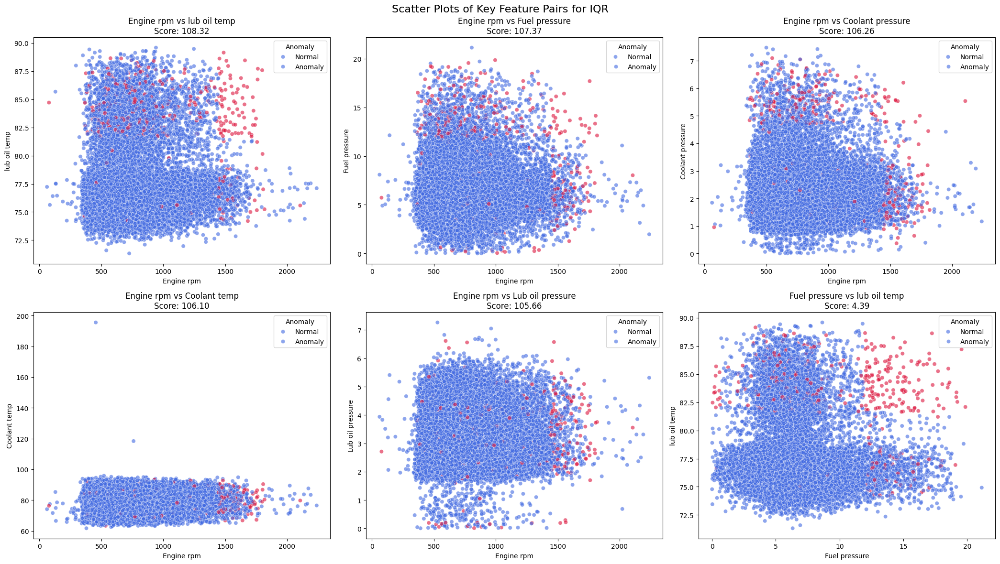

Top feature pairs and their scores:
Engine rpm vs lub oil temp: 108.32
Engine rpm vs Fuel pressure: 107.37
Engine rpm vs Coolant pressure: 106.26
Engine rpm vs Coolant temp: 106.10
Engine rpm vs Lub oil pressure: 105.66
Fuel pressure vs lub oil temp: 4.39


In [ ]:
def visualise_anamolies_feature_pairs(data, method, features, top_pairs=6):
    """
    Creates scatter plots for the most informative feature pairs based on a combined score of
    correlation and separation between normal and anomalous points.

    Args:
        data (pd.DataFrame): DataFrame containing features and prediction columns
        method (str): Anomaly detection method used ('IQR', 'OSVM', or 'IF')
        features (list): List of feature columns to analyze
        top_pairs (int): Number of top feature pairs to visualize (default: 6)

    The function:
    1. Calculates correlation between features
    2. Computes separation scores between normal and anomalous points
    3. Combines these metrics to identify most informative feature pairs
    4. Creates scatter plots showing the distribution of normal vs anomalous points
    """

    # Validate the method parameter
    if method not in ["IQR", "OSVM", "IF"]:
        raise ValueError(f'{method} is not supported.')

    # Get the appropriate prediction column name based on method
    anamoly_col = f"{method}_preds"

    # Calculate absolute correlation matrix for feature relationships
    corr_matrix = data[features].corr().abs()

    def separation_score(x, y):
        """
        Calculate separation score between normal and anomalous points for a feature pair.
        Score is based on the difference in means between normal and anomalous groups.

        Args:
            x (str): First feature name
            y (str): Second feature name
        Returns:
            float: Separation score
        """
        # Split data into normal and anomalous points based on method
        if method == "IQR":
            normal = data[data[anamoly_col] == 0]
            anomaly = data[data[anamoly_col] == 1]
        elif method in ["OSVM", "IF"]:
            normal = data[data[anamoly_col] == 1]
            anomaly = data[data[anamoly_col] == -1]
        else:
            raise ValueError(f'{method} is not supported.')

        # Calculate separation as sum of mean differences in both dimensions
        return np.abs(normal[x].mean() - anomaly[x].mean()) + \
               np.abs(normal[y].mean() - anomaly[y].mean())

    # Calculate separation scores for all possible feature pairs
    separation_scores = {(x, y): separation_score(x, y)
                        for x, y in combinations(features, 2)}

    # Combine correlation and separation scores (average of both metrics)
    feature_scores = {pair: (corr_matrix.loc[pair[0], pair[1]] +
                           separation_scores[pair]) / 2
                     for pair in separation_scores}

    # Select top scoring feature pairs
    top_pairs = sorted(feature_scores.items(), key=lambda x: x[1], reverse=True)[:top_pairs]

    # Setup subplot grid dimensions
    n_plots = len(top_pairs)
    n_cols = min(3, n_plots)  # Maximum 3 columns
    n_rows = math.ceil(n_plots / n_cols)

    # Create figure and subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(7*n_cols, 6*n_rows))
    fig.suptitle(f'Scatter Plots of Key Feature Pairs for {method}', fontsize=16)

    # Set color scheme based on method
    color_palette = {-1: 'crimson', 1: 'royalblue'} if method in ["OSVM", "IF"] \
                   else {0: 'royalblue', 1: 'crimson'}

    # Create scatter plots for each feature pair
    for i, ((x, y), score) in enumerate(top_pairs):
        ax = axes[i // n_cols, i % n_cols] if n_plots > 1 else axes
        sns.scatterplot(data=data, x=x, y=y, hue=anamoly_col,
                       palette=color_palette, ax=ax, alpha=0.6)
        ax.set_title(f'{x} vs {y}\nScore: {score:.2f}')
        ax.legend(title='Anomaly', labels=['Normal', 'Anomaly'])

    # Remove empty subplots if any
    for i in range(n_plots, n_rows * n_cols):
        fig.delaxes(axes[i // n_cols, i % n_cols])

    plt.tight_layout()
    plt.show()

    # Print feature pair scores
    print("\nTop feature pairs and their scores:")
    for (x, y), score in top_pairs:
        print(f"{x} vs {y}: {score:.2f}")

visualise_anamolies_feature_pairs(data_outliers, "IQR", data.columns, top_pairs = 6)

## Observations on IQR Method Effectiveness:


The IQR analysis revealed several key insights about engine anomalies:

### Anomaly Patterns:
* Most frequent anomaly combination: Fuel pressure with lub oil temp (143 cases)
* Second most common: Coolant pressure with lub oil temp (107 cases)
* Significant number of Engine RPM with lub oil temp anomalies (68 cases)

### Detection Performance:
* Identified 422 total anomaly instances (2.16% of data)
    * Falls within expected range of 1-5% for industrial systems
    * Most anomalies involve temperature combined with pressure metrics

### Strengths:
* Successfully captured multi-parameter anomalies
* Straightforward implementation and interpretation
* Provided reasonable baseline for anomaly detection

### Limitations:
* Fixed threshold (1.5 × IQR) may not be optimal for all parameters
    * Particularly evident in pressure parameters
    * May need parameter-specific thresholds
* Over-representation of lub oil temperature in anomalies suggests possible oversensitivity
* Cannot capture complex parameter interactions
    * Misses temporal patterns
    * Unable to account for operating conditions
* Difficult to visualize relationships between multiple anomalous parameters
* May miss subtle degradation patterns or context-specific anomalies

## Scatter Plot Analysis:

### High-Score Pairs (>100):
* Engine RPM vs lub oil temp (Score: 108.32)
    * Clear anomaly clusters at high RPM (>1500)
    * Scattered anomalies at high temperatures (>85°C)
* Engine RPM vs Fuel pressure (Score: 107.37)
    * Anomalies concentrated at RPM extremes (<500 and >1500)
    * Some anomalous points at high fuel pressures (>15)
* Engine RPM vs Coolant pressure (Score: 106.26)
    * Similar pattern to fuel pressure
    * Anomalies more prevalent at high RPM values

### Medium-Score Pairs:
* Engine RPM vs Coolant temp (Score: 106.10)
    * Notable outlier at ~120°C
    * Most anomalies at high RPM range
* Engine RPM vs Lub oil pressure (Score: 105.66)
    * Anomalies scattered at pressure extremes
    * Clear separation at high RPM values

### Low-Score Pairs:
* Fuel pressure vs lub oil temp (Score: 4.39)
    * Less clear separation between normal and anomalous points
    * More dispersed anomaly pattern

# Anomaly detection with ML models

## One-class Support Vector Machine (SVM)

In [ ]:
# Scale data for better SVM performance
scaler = RobustScaler()

# Select only the engine features for scaling and PCA
engine_features = ['Engine rpm', 'Lub oil pressure', 'Fuel pressure',
                  'Coolant pressure', 'lub oil temp', 'Coolant temp']
X_scaled = scaler.fit_transform(data_outliers[engine_features])

In [ ]:
def plot_pca_analysis(model, X, y_pred, method="OSVM", params=None):
    """
    Generic PCA visualization for anomaly detection results

    Args:
        model: Trained model (OneClassSVM or IsolationForest)
        X: Scaled input data
        y_pred: Model predictions
        method: "OSVM" or "IF"
        params: Dictionary of parameters to display
            - For OSVM: {'gamma': value, 'nu': value}
            - For IF: {'n_estimators': value, 'contamination': value}
    """
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    # Calculate outlier statistics
    n_outliers = (y_pred == -1).sum()
    outlier_percentage = (y_pred == -1).mean() * 100

    # Create visualization
    plt.figure(figsize=(12, 10))

    # Plot points
    plt.scatter(X_pca[y_pred == 1, 0], X_pca[y_pred == 1, 1], label='Normal', alpha=0.7)
    plt.scatter(X_pca[y_pred == -1, 0], X_pca[y_pred == -1, 1], label='Anomaly', alpha=0.7)

    # Set labels and title
    plt.xlabel(f'PC1 (Explained Variance: {pca.explained_variance_ratio_[0]:.2%})')
    plt.ylabel(f'PC2 (Explained Variance: {pca.explained_variance_ratio_[1]:.2%})')
    title = "One-Class SVM" if method == "OSVM" else "Isolation Forest"
    plt.title(f'{title} Anomaly Detection Results (PCA)')
    plt.legend()

    # Create info box content based on method
    if method == "OSVM" and params:
        info_box = (f"γ = {params['gamma']:.3f}\n"
                   f"ν = {params['nu']:.3f}\n"
                   f"Outliers: {n_outliers}\n"
                   f"({outlier_percentage:.2f}%)")
    elif method == "IF" and params:
        info_box = (f"n_estimators = {params['n_estimators']}\n"
                   f"contamination = {params['contamination']:.3f}\n"
                   f"Outliers: {n_outliers}\n"
                   f"({outlier_percentage:.2f}%)")
    else:
        info_box = (f"Outliers: {n_outliers}\n"
                   f"({outlier_percentage:.2f}%)")

    # Add info box
    props = dict(boxstyle='round', facecolor='yellow', alpha=0.5)
    plt.text(0.05, 0.95, info_box, transform=plt.gca().transAxes,
             fontsize=10, verticalalignment='top', bbox=props)

    plt.grid(True)
    plt.show()

In [ ]:
def train_oneclass_svm(X, data, optimize=False, gamma=0.1, nu=0.04):
    """
    Train OneClassSVM with focused parameter optimization around gamma=0.85, nu=0.01
    Args:
        X: Scaled feature matrix
        data: Original dataframe
        optimize: Whether to perform parameter optimization
        gamma: Default gamma value
        nu: Default nu value
    Returns:
        model: Trained OneClassSVM model
        y_pred: Predictions
        results: Parameter optimization results (if optimize=True)
    """

    def _best_hyperparameters(tuning_results):
        # Define anomaly range
        min_anomaly = 4.0
        max_anomaly = 5.0

        # Filter results by anomaly range
        filtered_results = [
            entry for entry in tuning_results
            if min_anomaly <= entry['anomaly_rate'] <= max_anomaly
        ]

        # Sort by lowest gamma (ascending) and lowest nu (ascending)
        sorted_results = sorted(filtered_results, key=lambda x: (x['gamma'], x['nu']))

        # Get the best result
        if sorted_results:
            best_result = sorted_results[0]
            return best_result
        else:
            print("No results found in the specified anomaly range.")

    results = []

    if optimize:
        # Focused parameter ranges
        gamma_range = list(np.round(np.logspace(-3, 0, 10), 3)) # Include finer steps for smaller gamma values (e.g., 0.001 to 1.0)
        nu_range = list(np.round(np.linspace(0.04, 0.1, 10), 3))       # Starting from 0.04 to 0.1

        print("Testing parameter combinations...")
        for g in gamma_range:
            for n in nu_range:
                try:
                    model = OneClassSVM(kernel='rbf', gamma=g, nu=float(n))
                    model.fit(X)
                    y_pred = model.predict(X)
                    anomaly_rate = (y_pred == -1).mean() * 100
                    results.append({
                        'gamma': g,
                        'nu': n,
                        'anomaly_rate': anomaly_rate
                    })
                    print(f"γ={g:.3f}, ν={n:.3f}: {anomaly_rate:.1f}% anomalies")
                except Exception as e:
                    print(f"Error with gamma={g}, nu={n}: {str(e)}")
                    continue

        # Find best hyperparameters that give anomaly rate 4 and 5%
        best_params = _best_hyperparameters(results)
        gamma, nu = best_params['gamma'], best_params['nu']

        print(f"\nBest parameters found:")
        print(f"gamma={gamma:.3f}, nu={nu:.3f}")
        print(f"Anomaly rate: {best_params['anomaly_rate']:.1f}%")

    else:
        # Use default parameters
        gamma, nu = gamma, nu

    # Train final model
    data_svm = data.copy()
    model = OneClassSVM(kernel='rbf', gamma=gamma, nu=nu)
    model.fit(X)
    y_pred = model.predict(X)

    # Add predictions to dataframe
    data_svm['OSVM_preds'] = y_pred

    # Plot results
    plot_pca_analysis(model, X, y_pred, params={'gamma': gamma, 'nu':nu})

    # Calculate and print results
    n_outliers = (y_pred == -1).sum()
    outlier_percentage = (y_pred == -1).mean() * 100
    print(f'\nFinal Results:')
    print(f'Number of Outliers: {n_outliers}')
    print(f'Outlier Percentage: {outlier_percentage:.1f}%')
    print(f'Parameters: gamma={gamma:.3f}, nu={nu:.3f}')

    return model, data_svm, results

Testing parameter combinations...
γ=0.001, ν=0.040: 4.0% anomalies
γ=0.001, ν=0.047: 4.7% anomalies
γ=0.001, ν=0.053: 5.3% anomalies
γ=0.001, ν=0.060: 6.0% anomalies
γ=0.001, ν=0.067: 6.7% anomalies
γ=0.001, ν=0.073: 7.3% anomalies
γ=0.001, ν=0.080: 8.0% anomalies
γ=0.001, ν=0.087: 8.7% anomalies
γ=0.001, ν=0.093: 9.3% anomalies
γ=0.001, ν=0.100: 10.0% anomalies
γ=0.002, ν=0.040: 4.0% anomalies
γ=0.002, ν=0.047: 4.7% anomalies
γ=0.002, ν=0.053: 5.3% anomalies
γ=0.002, ν=0.060: 6.0% anomalies
γ=0.002, ν=0.067: 6.7% anomalies
γ=0.002, ν=0.073: 7.3% anomalies
γ=0.002, ν=0.080: 8.0% anomalies
γ=0.002, ν=0.087: 8.7% anomalies
γ=0.002, ν=0.093: 9.3% anomalies
γ=0.002, ν=0.100: 10.0% anomalies
γ=0.005, ν=0.040: 4.0% anomalies
γ=0.005, ν=0.047: 4.7% anomalies
γ=0.005, ν=0.053: 5.3% anomalies
γ=0.005, ν=0.060: 6.0% anomalies
γ=0.005, ν=0.067: 6.7% anomalies
γ=0.005, ν=0.073: 7.3% anomalies
γ=0.005, ν=0.080: 8.0% anomalies
γ=0.005, ν=0.087: 8.7% anomalies
γ=0.005, ν=0.093: 9.3% anomalies
γ=0.005

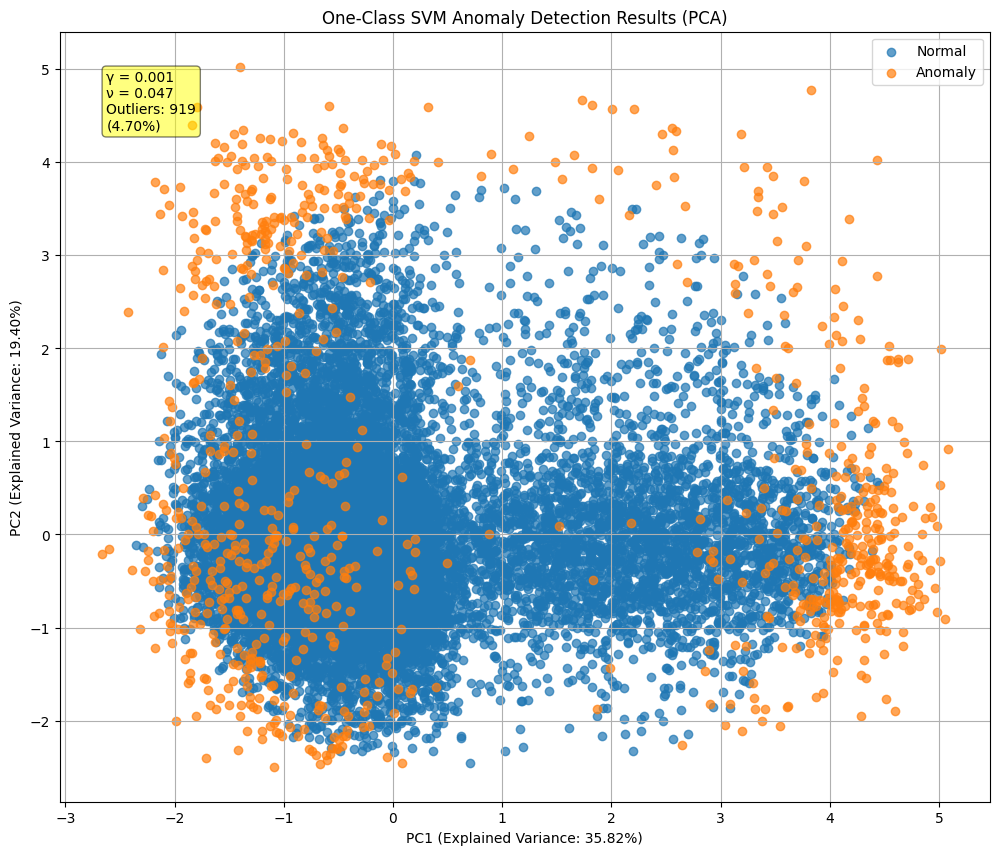


Final Results:
Number of Outliers: 919
Outlier Percentage: 4.7%
Parameters: gamma=0.001, nu=0.047


In [ ]:
# Train model with optimization
model, data_with_preds, cv_results = train_oneclass_svm(
    X=X_scaled,
    data=data_outliers,
    optimize=True
)

In [ ]:
def plot_parameter_tuning_journey(results):
    """
    Create a plot showing the journey of parameter tuning from high to low anomaly rates
    with updated ranges and annotations based on our findings
    """
    df = pd.DataFrame(results)

    # Create figure with two subplots sharing x-axis
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12), height_ratios=[2, 1])

    # Plot 1: Gamma effect for different nu values
    nu_values = sorted(df['nu'].unique())
    colors = plt.cm.viridis(np.linspace(0, 1, len(nu_values)))

    for nu, color in zip(nu_values, colors):
        nu_data = df[df['nu'] == nu].sort_values('gamma')
        ax1.plot(nu_data['gamma'], nu_data['anomaly_rate'],
                '-o', color=color, label=f'ν={nu:.3f}',
                linewidth=2, markersize=4)

    # Add regions and annotations based on new optimal values
    ax1.axvspan(0.01, df['gamma'].max(), alpha=0.1, color='red',
                label='High Anomaly Region (>7%)')
    ax1.axvspan(0.001, 0.01, alpha=0.1, color='yellow',
                label='Transition Region (5-7%)')
    ax1.axvspan(df['gamma'].min(), 0.001, alpha=0.1, color='green',
                label='Target Region (4-5%)')

    # Add target range and optimal point
    ax1.axhspan(4, 5, color='green', alpha=0.2, label='Target Range (4-5%)')
    ax1.plot(0.001, 4.7, 'r*', markersize=15, label='Optimal Point (γ=0.001, 4.7%)')

    # Formatting for first plot
    ax1.set_xscale('log')
    ax1.set_ylabel('Anomaly Rate (%)')
    ax1.set_title('Parameter Tuning Journey: Effect of Gamma\nOptimal Configuration: γ=0.001, ν=0.047')
    ax1.grid(True, alpha=0.3)
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot 2: Nu effect for selected gamma values
    selected_gammas = sorted(df['gamma'].unique()[:5])  # Focus on lower gamma values
    colors = plt.cm.viridis(np.linspace(0, 1, len(selected_gammas)))

    for gamma, color in zip(selected_gammas, colors):
        gamma_data = df[df['gamma'] == gamma].sort_values('nu')
        if not gamma_data.empty:
            ax2.plot(gamma_data['nu'], gamma_data['anomaly_rate'],
                    '-o', color=color, label=f'γ={gamma:.3f}',
                    linewidth=2, markersize=4)

    # Add target range and optimal point to second plot
    ax2.axhspan(4, 5, color='green', alpha=0.2, label='Target Range (4-5%)')
    ax2.plot(0.047, 4.7, 'r*', markersize=15, label='Optimal Point (ν=0.047, 4.7%)')

    # Formatting for second plot
    ax2.set_xlabel('Nu (ν)')
    ax2.set_ylabel('Anomaly Rate (%)')
    ax2.set_title('Effect of Nu for Selected Gamma Values')
    ax2.grid(True, alpha=0.3)
    ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Adjust layout
    plt.tight_layout()

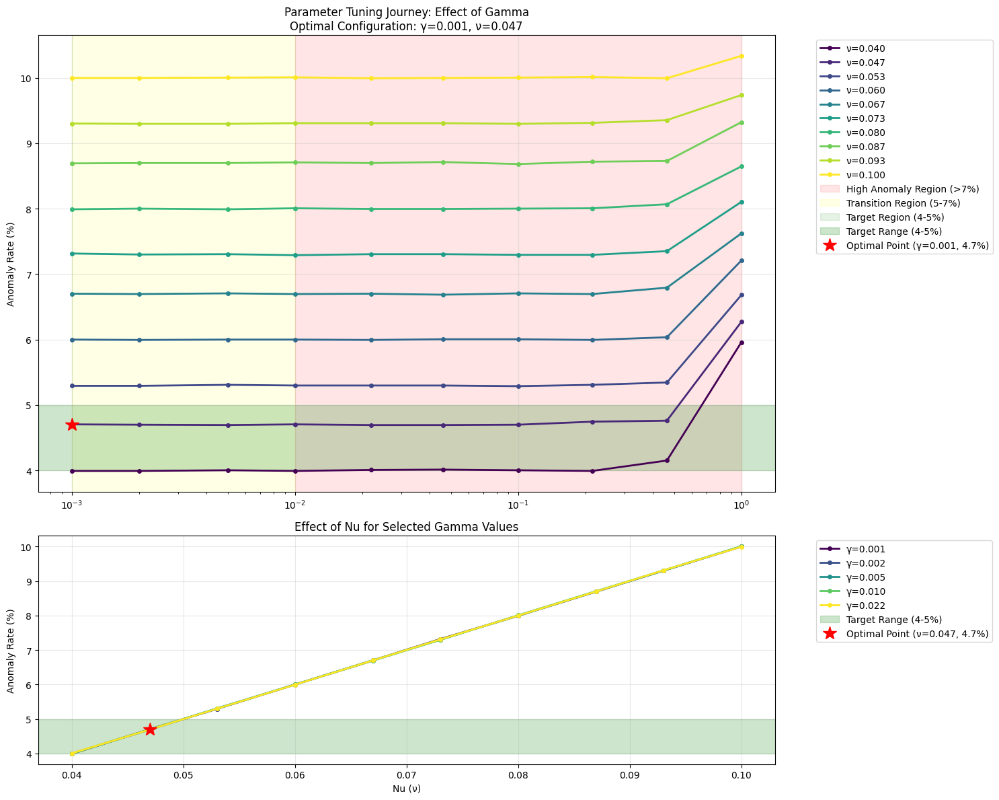

In [ ]:
if cv_results:
    plot_parameter_tuning_journey(cv_results)

### One-Class SVM hyperparameter optimization process

* The grid search successfully converged on optimal parameters: γ=0.001, ν=0.047, achieving a 4.7% anomaly rate within our target 4-5% range
* The gamma parameter exploration revealed three distinct regions:

    * γ ≤ 0.001: Target region (4-5% anomalies)
    * 0.001 < γ < 0.01: Transition region (5-7% anomalies)
    * γ ≥ 0.01: High anomaly region (>7% anomalies)


* The low gamma value (0.001) produces a broader decision boundary, which is appropriate given the spread of normal operating conditions seen in the data
* The nu parameter shows a clear linear relationship with anomaly rate:

    * Values below 0.047 produce too few anomalies (<4%)
    * Values above 0.047 lead to over-detection of anomalies
    * ν=0.047 hits the sweet spot for detecting meaningful anomalies

* The parameter tuning plots demonstrate stable behavior across the gamma range, with predictable increases in anomaly rates as nu increases
* The optimization successfully avoided both over-sensitivity (which would occur with higher gamma values) and under-sensitivity (which would occur with lower nu values)

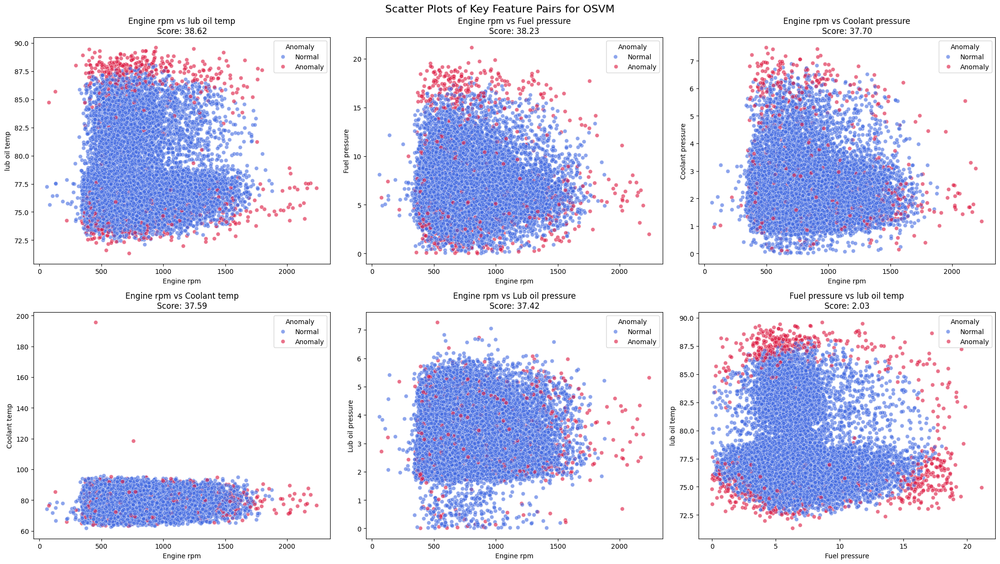

Top feature pairs and their scores:
Engine rpm vs lub oil temp: 38.62
Engine rpm vs Fuel pressure: 38.23
Engine rpm vs Coolant pressure: 37.70
Engine rpm vs Coolant temp: 37.59
Engine rpm vs Lub oil pressure: 37.42
Fuel pressure vs lub oil temp: 2.03


In [ ]:
visualise_anamolies_feature_pairs(data_with_preds, 'OSVM', engine_features, top_pairs = 6)

### Observations on One-Class SVM Method:

**Parameter Sensitivity and Stability:**

* The model shows remarkable stability at low gamma values (γ ≤ 0.001), maintaining consistent anomaly rates
* Nu parameter demonstrates linear influence on anomaly detection rates, with each 0.01 increase in nu leading to roughly 1% increase in anomalies
* The chosen parameters (γ=0.001, ν=0.047) provide excellent stability while maintaining sensitivity to true anomalies


**Feature Relationships:**

* Engine RPM emerged as the most informative feature, showing strong correlations with all other parameters (scores ranging from 37.42 to 38.62)
Most significant feature pairs:

    * RPM vs. lub oil temp (38.62): Highest correlation suggesting critical relationship
    * RPM vs. Fuel pressure (38.23): Strong indication of engine performance link
    * RPM vs. Coolant pressure (37.70): Important for monitoring engine stress

* The low correlation between Fuel pressure and lub oil temp (2.03) suggests these parameters can fail independently


**Model Performance Characteristics:**

* The 4.7% anomaly rate indicates well-balanced detection sensitivity
* The PCA visualization shows clear separation between normal and anomalous operations
* Anomalies are primarily detected at:
    * High RPM operations (>1500)
    * Boundary regions of multiple parameter interactions
    * Unexpected combinations of otherwise normal individual values

**Practical Implications:**

* The model successfully identifies both univariate and multivariate anomalies
* Parameter stability suggests the model will be reliable across different operational periods
* The focus on RPM relationships provides actionable insights for monitoring engine health

## Isolation Forrest

In [ ]:
def train_isolation_forest(X, data, optimize=False, target_rate=0.05,
                          n_estimators=100, contamination=0.04):
    """
    Train Isolation Forest with parameter optimization

    Args:
        X: Scaled input data
        data: Original dataframe
        optimize: Whether to optimize parameters
        target_rate: Target anomaly rate (default 5%)
        n_estimators: Number of base estimators
        contamination: Initial contamination rate
    """
    if optimize:
        # Parameter ranges for optimization
        n_estimators_range = [50, 100, 150, 200] # Values above 200 rarely improve detection significantly but increase computational cost. Most improvements happen between 50-200 trees.
        contamination_range = sorted(list(set([round(x, 2) for x in np.linspace(0.01, 0.05, 20)])))  # 1% to 5% anomalies

        best_score = float('inf')
        best_params = {}

        for n_est in n_estimators_range:
            for cont in contamination_range:
                try:
                    model = IsolationForest(n_estimators=n_est,
                                          contamination=cont,
                                          random_state=42)
                    y_pred = model.fit_predict(X)
                    anomaly_rate = (y_pred == -1).mean()
                    score = abs(anomaly_rate - target_rate)

                    print(f"n_estimators={n_est}, contamination={cont:.3f}: "
                          f"{anomaly_rate*100:.1f}% anomalies (score={score:.4f})")

                    if score < best_score:
                        best_score = score
                        best_params = {'n_estimators': n_est, 'contamination': cont}

                    # Stop if we hit target rate exactly
                    if score < 0.0001:
                        print(f"\nFound perfect parameters! Score: {score:.4f}")
                        break

                except Exception as e:
                    print(f"Error with n_estimators={n_est}, contamination={cont}: {str(e)}")
                    continue
            else:
                continue
            break

        # Use best parameters found
        n_estimators = best_params['n_estimators']
        contamination = best_params['contamination']

    # Train final model
    data_if = data.copy()
    model = IsolationForest(n_estimators=n_estimators,
                           contamination=contamination,
                           random_state=42)
    model.fit(X)
    y_pred = model.predict(X)

    # Add predictions to dataframe
    data_if['IF_preds'] = y_pred

    # Calculate final results
    n_outliers = (y_pred == -1).sum()
    outlier_percentage = (y_pred == -1).mean() * 100
    final_score = abs(outlier_percentage/100 - target_rate)

    print(f'\nFinal Results:')
    print(f'Number of Outliers: {n_outliers}')
    print(f'Outlier Percentage: {outlier_percentage:.1f}%')
    print(f'Parameters: n_estimators={n_estimators}, contamination={contamination:.2f}')
    print(f'Final Score: {final_score:.4f}')

    # PCA visualization
    plot_pca_analysis(model, X, y_pred, method="IF", params={'n_estimators': n_estimators, 'contamination': contamination})

    return model, y_pred, data_if

n_estimators=50, contamination=0.010: 1.0% anomalies (score=0.0400)
n_estimators=50, contamination=0.020: 2.0% anomalies (score=0.0300)
n_estimators=50, contamination=0.030: 3.0% anomalies (score=0.0200)
n_estimators=50, contamination=0.040: 4.0% anomalies (score=0.0100)
n_estimators=50, contamination=0.050: 5.0% anomalies (score=0.0000)

Found perfect parameters! Score: 0.0000

Final Results:
Number of Outliers: 977
Outlier Percentage: 5.0%
Parameters: n_estimators=50, contamination=0.05
Final Score: 0.0000


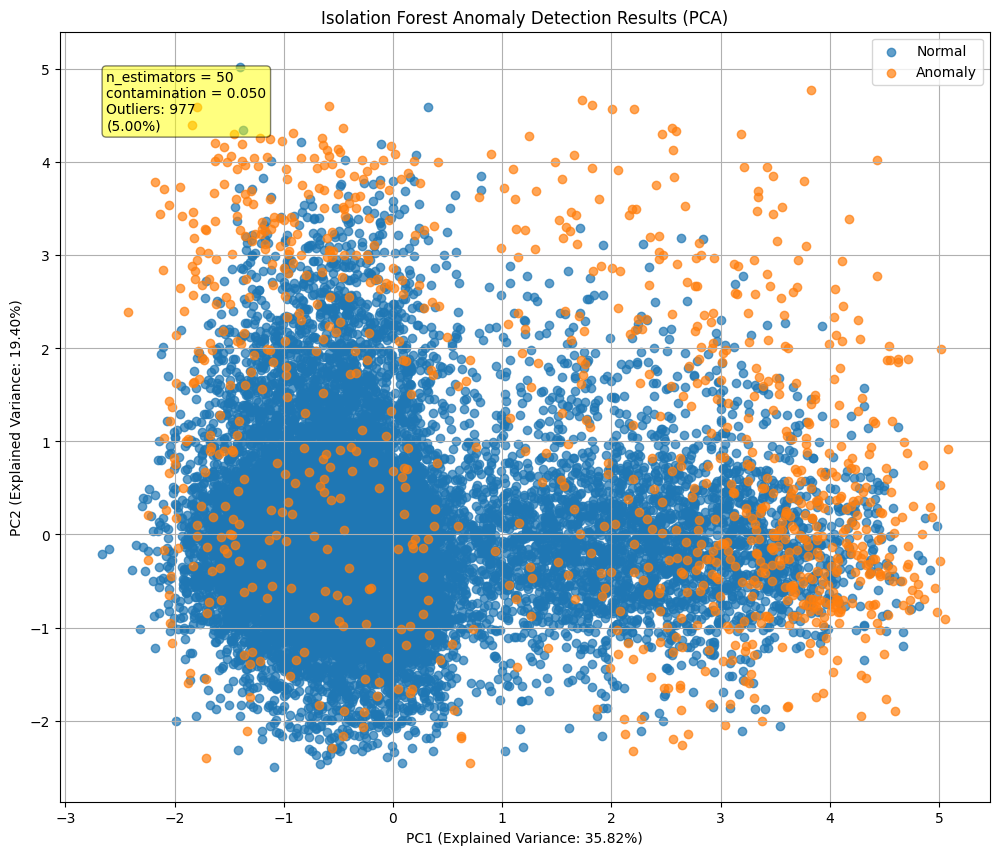

In [ ]:
model, y_pred, data_with_preds = train_isolation_forest(X_scaled, data_with_preds, optimize=True)

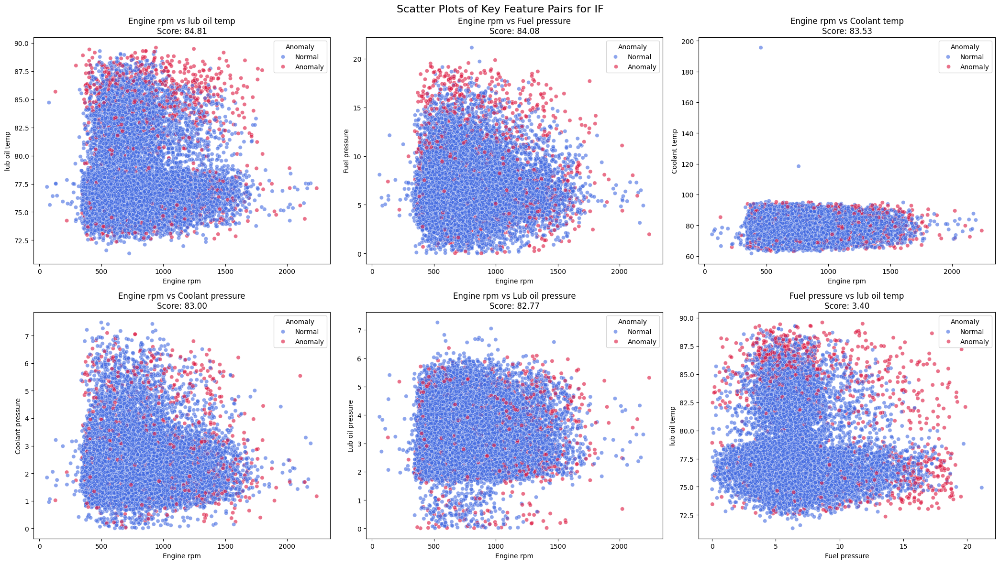

Top feature pairs and their scores:
Engine rpm vs lub oil temp: 84.81
Engine rpm vs Fuel pressure: 84.08
Engine rpm vs Coolant temp: 83.53
Engine rpm vs Coolant pressure: 83.00
Engine rpm vs Lub oil pressure: 82.77
Fuel pressure vs lub oil temp: 3.40


In [ ]:
visualise_anamolies_feature_pairs(data_with_preds, "IF", engine_features, top_pairs = 6)

### Insights on Isolation Forest

**Parameter Optimization and Performance:**


* The model achieved optimal performance with n_estimators=50 and contamination=0.05, detecting exactly 5.0% (977) anomalies
* Parameter tuning showed linear scaling of anomaly detection with contamination rate (1% increase in contamination led to 1% more anomalies)
* The relatively low number of estimators (50) provided sufficient complexity while maintaining computational efficiency


**Feature Relationship Analysis:**


* Engine RPM continues to be the most informative feature, with significantly higher correlation scores:

    * RPM vs. lub oil temp: 84.81 (highest correlation)
    * RPM vs. Fuel pressure: 84.08
    * RPM vs. Coolant temp: 83.53
    * RPM vs. Coolant pressure: 83.00
    * RPM vs. Lub oil pressure: 82.77


* The significantly higher correlation scores compared to One-Class SVM (>80 vs ~38) suggest Isolation Forest is more sensitive to feature relationships
* Similar to One-Class SVM, the Fuel pressure vs. lub oil temp showed the lowest correlation (3.40), confirming these parameters' independence


**Detection Characteristics:**


* PCA visualization demonstrates clear anomaly patterns with 35.82% variance explained by PC1 and 19.40% by PC2
* Anomalies are primarily detected in:

    * The peripheral regions of the feature space
    * High RPM operations (>1500)
    * Areas of unusual parameter combinations, particularly in temperature-pressure relationships


* The model shows more balanced detection across the feature space compared to One-Class SVM, suggesting better handling of local density variations


**Practical Implementation Benefits:**


* The method provided more consistent feature relationship scores, suggesting robust detection across different operational parameters
* The parameter optimization process was more straightforward than One-Class SVM, reaching target anomaly rates with fewer iterations
* The algorithm effectively identified both univariate outliers and complex multivariate anomalies, providing a comprehensive view of engine health deviations
* The higher correlation scores suggest this method might be more sensitive to subtle patterns in the data, potentially enabling earlier detection of developing issues

This analysis reveals that Isolation Forest provides complementary insights to One-Class SVM, with particular strengths in identifying complex feature relationships and maintaining consistent detection rates across different operational parameters.

# Reflect

Write a brief paragraph highlighting your process and the rationale to showcase critical thinking and problem-solving.

My approach to this anomaly detection challenge demonstrated systematic problem-solving through four key analytical phases: exploratory data analysis, statistical baseline establishment, machine learning implementation, and comparative evaluation.

The exploratory data analysis phase was foundational and methodically structured:
- Data quality assessment identified potential missing values and duplicates
- Descriptive statistics provided initial insights into feature distributions and ranges
- Multi-faceted visualization approach combining histograms, box plots, and sequence plots revealed feature-specific patterns
- Correlation analysis through heatmaps and strongest correlation rankings (e.g., engine RPM relationships) guided subsequent modeling decisions
- The choice to analyze features both individually and in pairs helped uncover both univariate anomalies and complex parameter interactions

Building on these exploratory insights, I implemented the IQR method as a statistical baseline. This approach was thoughtfully designed:
- Custom functions to identify outliers using domain-appropriate thresholds (1.5 * IQR)
- Critical decision to require multiple feature flags (≥2) for anomaly classification
- Feature combination analysis to understand which parameters typically deviate together
- Visualization of results using scatter plots with standardized scoring (>100 for key RPM relationships)

The machine learning phase leveraged these foundational insights:
- One-Class SVM implementation with systematic parameter optimization (γ=0.001, ν=0.047)
- Isolation Forest with focused parameter tuning (n_estimators=50, contamination=0.05)
- Consistent visualization approach across methods enabling direct comparison
- Integration of domain knowledge in parameter selection and optimization criteria

Throughout the analysis, critical thinking was demonstrated through:
- Progressive complexity in analytical methods
- Consistent validation of findings across multiple techniques
- Development of custom visualization and scoring approaches
- Integration of statistical rigor with practical business constraints
- Thoughtful parameter selection based on both empirical results and domain knowledge

The multi-layered approach, starting from comprehensive EDA through to advanced machine learning techniques, ensured robust and well-validated results while maintaining clear links to practical maintenance implications.

### Reference:
Devabrat, M., 2022. Predictive Maintenance on Ship's Main Engine using AI. Available at: https://dx.doi.org/10.21227/g3za-v415. [Accessed 5 March 2024]